In this experiment i will try to modify the treshold but for that we will be runing the experiment in a smaller sampler so we can had an oportunity to see how it performs in a smaller dataset.

In [ ]:
from google.colab import drive
import os
import torch
drive.mount('/content/drive')

enable_code_paths = True
enable_block = False

if enable_code_paths:
    URL_path = "/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/dataset/clean_dataset.csv"
    URL_path_save = "/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/model"
    URL_helper ="/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/helper/"
    URL_hyperparameters ="/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/hyperparameters/"
    URL_test_labels ="/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/helper/dataset/test_labels.csv"
    URL_test ="/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/helper/dataset/test.csv"
else :
    URL_path = "/content/drive/MyDrive/turing_college_experiments/14_NLP/helper"
    URL_path_save = "/content/drive/MyDrive/turing_college_experiments/14_NLP/model"
    URL_helper = "/content/drive/MyDrive/turing_college_experiments/14_NLP/helper"
import sys
sys.path.append(URL_helper)

from colab_helper import proportion_balance_classes

In [ ]:
num_cores = os.cpu_count()  # Get the number of CPU cores
print(f'Number of available CPU cores: {num_cores}')
num_workers_colab = num_cores - 1
print(f'Setting num_workers to: {num_workers_colab}')

num_gpus_colab = torch.cuda.device_count()
gpu_list = [torch.cuda.get_device_name(i) for i in range(num_gpus_colab)]
num_gpus_colab, gpu_list

Number of available CPU cores: 12
Setting num_workers to: 11


(1, ['NVIDIA L4'])

Now we will be installing all the modules that are required

In [ ]:
%%capture
!pip install pytorch_lightning

We will be exploring the Bert model and see if we could find any good performance

In [ ]:
## Core Libraries
import os
import time
import math
import numpy as np
import pandas as pd

# PyTorch Libraries and Lightning
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, RandomSampler, SequentialSampler
from torch.optim import AdamW
import pytorch_lightning as pl

# Hugging Face Transformers
from transformers import (
    AutoTokenizer, AutoModel,
    get_linear_schedule_with_warmup
)

# Sklearn for Evaluation Metrics and Model Selection
from sklearn import metrics
from sklearn.metrics import (
    accuracy_score, recall_score, multilabel_confusion_matrix, ConfusionMatrixDisplay
)
from sklearn.model_selection import train_test_split

# Visualization Libraries
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import plotly.graph_objects as go

# Progress Bar
from tqdm import tqdm

# Hyperparameter Tuning
# import optuna
import joblib

# Google Colab (if applicable)
from google.colab import drive

# TorchMetrics (for AUROC calculation)
from torchmetrics.functional.classification import auroc

from torch import cuda
device = 'cuda' if cuda.is_available() else 'cpu'

# colorama
custom_colors = ['#36CE8A', "#7436F5","#3736F4",   "#36AEF5", "#B336F5", "#f8165e", "#36709A",  "#3672F5", "#7ACE5D"]
gradient_colors = [ "#36CE8A", '#7436F5']
color_palette_custom  = sns.set_palette(custom_colors)
theme_color = sns.color_palette(color_palette_custom, 9)
cmap_theme = LinearSegmentedColormap.from_list('custom_colormap', gradient_colors)
theme_color

[(0.21176470588235294, 0.807843137254902, 0.5411764705882353),
 (0.4549019607843137, 0.21176470588235294, 0.9607843137254902),
 (0.21568627450980393, 0.21176470588235294, 0.9568627450980393),
 (0.21176470588235294, 0.6823529411764706, 0.9607843137254902),
 (0.7019607843137254, 0.21176470588235294, 0.9607843137254902),
 (0.9725490196078431, 0.08627450980392157, 0.3686274509803922),
 (0.21176470588235294, 0.4392156862745098, 0.6039215686274509),
 (0.21176470588235294, 0.4470588235294118, 0.9607843137254902),
 (0.47843137254901963, 0.807843137254902, 0.36470588235294116)]

In [ ]:
dataframe_test.head()

NameError: name 'dataframe_test' is not defined

In [ ]:
dataframe = pd.read_csv(URL_path)
URL_test_labels ="/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/helper/dataset/test_labels.csv"
URL_test ="/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/helper/dataset/test.csv"
dataframe_test = pd.read_csv(URL_test)
# dataframe_test_labels = pd.read_csv(URL_test_labels)


dataframe.head()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Code/Data_science_Turing_college/Colabs/14_002_NLP/helper/dataset/test.csv'

tensor([0.4357, 0.0435, 0.2409, 0.0137, 0.2262, 0.0400])
total samples 144790


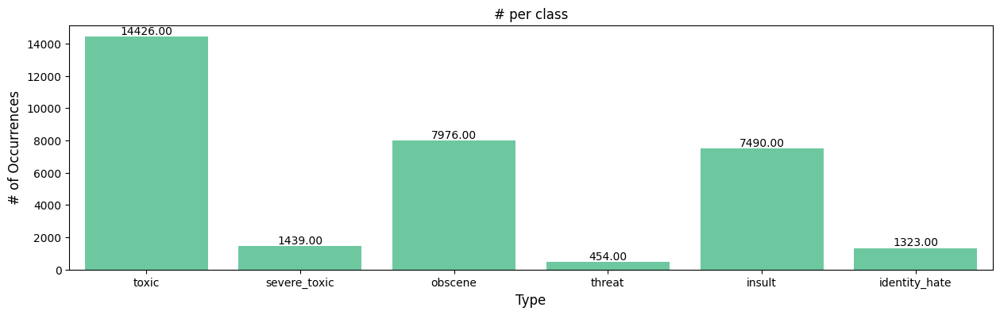

In [ ]:
target_y =dataframe.iloc[:,1:].sum()

weights_list = target_y.tolist()
weights = torch.tensor(weights_list, dtype=torch.float32)
normalized_weights = weights / weights.sum()
print(normalized_weights)

print(f"total samples {dataframe.shape[0]}")
proportion_balance_classes(target_y.index, target_y.values)

Now we will split the dataset to understand whats happening

In [ ]:
attributes = ["toxic", "severe_toxic", "obscene", "threat", "insult", "identity_hate"]
new_attributes = attributes + ["non_toxic"]

# Use the attributes list in the condition
dataframe["non_toxic"] = np.where(dataframe[attributes].any(axis=1), 0, 1)
dataframe.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,non_toxic
0,ExplanationWhy the edits made under my usernam...,0,0,0,0,0,0,1
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,1
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,1
3,"""MoreI can't make any real suggestions on impr...",0,0,0,0,0,0,1
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,1


In [ ]:
# drop the non toxic column
dataframe.drop(columns= ["non_toxic"], inplace= True)

# sample sisze
SAMPLE_PERCENTAGE = 1
dataframe_clean=dataframe.sample(frac=SAMPLE_PERCENTAGE,random_state=42)

# split
train_size = 0.8
train_dataset=dataframe_clean.sample(frac=train_size,random_state=42)
test_dataset=dataframe_clean.drop(train_dataset.index).reset_index(drop=True)
train_dataset = train_dataset.reset_index(drop=True)

print("FULL Dataset: {}".format(dataframe_clean.shape))
print("TRAIN Dataset: {}".format(train_dataset.shape))
print("TEST Dataset: {}".format(test_dataset.shape))

FULL Dataset: (144790, 7)
TRAIN Dataset: (115832, 7)
TEST Dataset: (28958, 7)


<ipython-input-75-eaaafe0a5637>:17: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-75-eaaafe0a5637>:17: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-75-eaaafe0a5637>:17: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



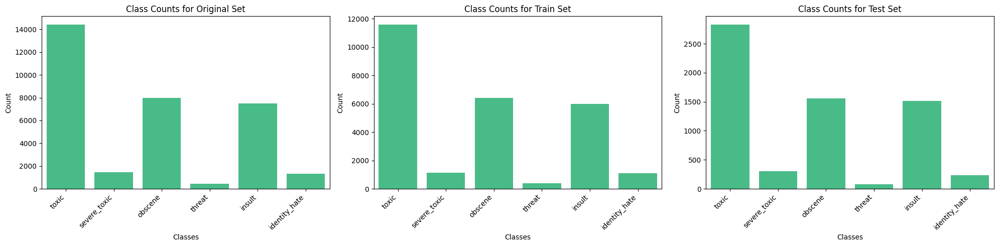

In [ ]:
# Summing over each column to count occurrences of each class in each dataset
all_counts_dfs = pd.DataFrame({
    'Original Set': dataframe_clean[attributes].sum(),
    'Train Set': train_dataset[attributes].sum(),
    'Test Set': test_dataset[attributes].sum()
})

# Plot setup
fig, axes = plt.subplots(nrows=1, ncols=len(all_counts_dfs.columns), figsize=(20, 5))

# Iterate over the columns to create a bar chart for each dataset
for ax, column in zip(axes, all_counts_dfs.columns):
    sns.barplot(x=all_counts_dfs.index, y=all_counts_dfs[column], ax=ax)
    ax.set_title(f'Class Counts for {column}')
    ax.set_xlabel('Classes')
    ax.set_ylabel('Count')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")  # Rotate x labels for better visibility

# Adjust layout
plt.tight_layout()
plt.show()

# Create a dataset

We will be preparing the dataset for the importation!

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, dataframe: pd.DataFrame, comment_str_title: str,  tokenizer, attributes, max_token_len= 128, sample= 5000):

        assert isinstance(dataframe, pd.DataFrame), "dataframe needs to be a pandas DataFrame for this code to work"

        self.dataframe = dataframe
        self.tokenizer = tokenizer
        self.max_token_len = max_token_len
        self.attributes = attributes
        self.sample = sample
        self._prepare_data()

        # column to select
        self.comment_str_title = comment_str_title

    def _prepare_data(self):
        """Prepare the data and imported"""
        # data = pd.read_csv(self.data_path)
        data = self.dataframe.copy()
        # add the non toxic column
        data["non_toxic"] = np.where(data[attributes].any(axis=1), 0, 1)
        # data["unhealthy"] = np.where(data["healthy"] == 1, 0, 1)

        # extract the sample with some attributes
        if self.sample is not None:
            toxic = data.loc[data[self.attributes].sum(axis=1) > 0]
            non_toxic = data.loc[data[self.attributes].sum(axis=1) == 0]
            # extract the sample from the healthy values
            non_toxic = non_toxic.sample(min(self.sample, len(non_toxic)), random_state=7)
            self.data = pd.concat([non_toxic, toxic])
        else:
            self.data = data

    def __len__(self):
        """Length of the dataset"""
        return (len(self.data))

    def __getitem__(self, index):
        """Get item from the dataset"""
        data_row = self.data.iloc[index]

        # item as a string
        comment = str(data_row[self.comment_str_title])
        # attributes_numbers = torch.FloatTensor(data_row.iloc[self.attributes])
        attributes_numbers = torch.FloatTensor(data_row[self.attributes].values.astype(float))

        # extract the tokens and prepared to apply it to the comment line
        tokens = self.tokenizer.encode_plus(
                    comment,
                    add_special_tokens = True,
                    max_length = self.max_token_len,
                    padding = 'max_length',
                    truncation = True, # cap the comments to a max length of tokens
                    return_tensors = 'pt', # return tensors
                    return_attention_mask = True,
                    return_token_type_ids = False, # this its not need it
                    )

        return {'input_id': tokens.input_ids.flatten(),
                'attention_mask': tokens.attention_mask.flatten(),
                'labels': attributes_numbers,
                'labels_names': self.attributes}


Verify it works, for this we will use the double od the toxic comments that its 14k and we will be adding those as non toxic samples to had the dataset prepared

In [ ]:
model_name = 'roberta-base'
tokenizer_roberta = AutoTokenizer.from_pretrained(model_name)
dataset_loader = CustomDataset(
    dataframe= train_dataset,
    comment_str_title = 'comment_text',
    attributes = attributes,
    tokenizer = tokenizer_roberta,
    max_token_len = 256,
    sample=14500)


# data_path, comment_str_title: str,  tokenizer, attributes, max_token_len= 128, sample= 5000
print(dataset_loader.__len__())
dataset_loader

26763


Now we could see that we had 29k of samples for training the model the double of samples that are not

In [ ]:
dataset_loader.__getitem__(0)

{'input_id': tensor([    0,   113, 29309,  1619,   328,  3982,  1178,  1866, 38740, 15483,
          6960,  1437,    16, 17802,    47,    10, 29309,  1619,   328,   152,
         25801,    36,   463,   191,    43, 15885, 45569, 16587,     8,  5952,
            42,  1591,    34,   156,   110,   183,    10,   410,   357,     4,
         29192,     5, 45569, 16587,    30, 17802,   277,  3018,    10, 29309,
          1619,     6,   549,    24,    28,   951,    47,    33,    56, 24461,
            19,    11,     5,   375,     6,    10,   205,  1441,     6,    50,
            95,   103,  9624,   621,     4,  1599,    75,  3529,  5718,  1958,
           328,  1437,  1437, 29192,     5,  2317,  9450,    30,  1271, 47517,
         10936,   620,    35, 44518,    35,   597,  5112,   154,    73,  6018,
         27418, 46961,     7,    49,  1067,  1842,    19,    10,  5192,  1579,
            72,     2,     1,     1,     1,     1,     1,     1,     1,     1,
             1,     1,     1,     1,    

Seems that one example its working correctly

# Data loader

In [ ]:
class Data_loader_Custom(pl.LightningDataModule):
    def __init__(self, train_dataframe, val_dataframe , attributes, comment_str_title: str, tokenizer,model_name = 'roberta-base',   batch_size= 16, max_token_len= 128 , sample= 5000, num_workers= 4, prediction_count = False):
        super().__init__()
        self.train_dataframe = train_dataframe
        self.val_dataframe = val_dataframe
        self.batch_size = batch_size
        self.max_token_len = max_token_len
        self.comment_str_title = comment_str_title
        self.attributes = attributes
        self.sample = sample
        self.num_workers = num_workers
        self.tokenizer = tokenizer
        self.model_name = model_name
        self.prediction_count = prediction_count

        # check if exist
        self.has_train_data = train_dataframe is not None
        self.has_val_data = val_dataframe is not None

    def __len__(self):
        if self.has_train_data:
            return len(self.train_dataset)
        if self.has_val_data:
            return len(self.validation_dataset)

    def len_predictions(self):
        if self.has_val_data:
            return len(self.validation_dataset)

    # this its using the LightningDataModule for seting up
    def setup(self, stage= None):
        if stage in (None, 'fit'):
            # train set
            self.train_dataset = CustomDataset(
                                dataframe=  self.train_dataframe,
                                comment_str_title =  self.comment_str_title,
                                attributes =  self.attributes,
                                tokenizer =  self.tokenizer,
                                max_token_len =  self.max_token_len,
                                sample= self.sample)
            # validation set
            self.validation_dataset = CustomDataset(
                                dataframe=  self.val_dataframe,
                                comment_str_title =  self.comment_str_title,
                                attributes =  self.attributes,
                                tokenizer =  self.tokenizer,
                                max_token_len =  self.max_token_len,
                                sample= self.sample)
        if stage == 'predict':
            self.predict_dataset  = CustomDataset(
                                dataframe=  self.val_dataframe,
                                comment_str_title =  self.comment_str_title,
                                attributes =  self.attributes,
                                tokenizer =  self.tokenizer,
                                max_token_len =  self.max_token_len,
                                sample= self.sample)

    # dataload the the different sets
    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, num_workers=  self.num_workers, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.validation_dataset, batch_size=self.batch_size, num_workers= self.num_workers, shuffle=False)

    def predict_dataloader(self):
        return DataLoader(self.predict_dataset, batch_size=self.batch_size, num_workers= self.num_workers, shuffle=False)


Verify it works

In [ ]:
data_module_custom = Data_loader_Custom(
                   train_dataframe = train_dataset,
                   val_dataframe = test_dataset,
                   attributes = attributes,
                   comment_str_title = 'comment_text',
                   tokenizer = AutoTokenizer.from_pretrained('roberta-base'),
                   batch_size= 8,
                   max_token_len= 128 ,
                   sample= 14500,
                   num_workers= 2,
                   prediction_count= False)

# setup the data in dataloaders
data_module_custom.setup()
print(len(data_module_custom))
print(data_module_custom.len_predictions())
# prepare the data batches
dl = data_module_custom.train_dataloader()
print(f"batches train:{len(dl)}")
dl = data_module_custom.val_dataloader()
print(f"batches train:{len(dl)}")

# we enalbe the prediction so we can see the values of precit
data_module_custom.setup(stage='predict')
dl = data_module_custom.predict_dataloader()
print(f"batches train:{len(dl)}")

26763
17501
batches train:3346
batches train:2188
batches train:2188


Now that we had the custom batch prepared, we will start with the model creation.

----------

# Model creation

In [ ]:
class Classifier_model(pl.LightningModule):
    def __init__(self, config: dict):
        super().__init__()
        self.config = config

        # pretrain the model
        self.pretrained_model = AutoModel.from_pretrained(config['model_name'], return_dict=True)

        # add the other layers of the model
        self.hidden = nn.Linear(self.pretrained_model.config.hidden_size, self.pretrained_model.config.hidden_size)
        self.classification = nn.Linear(self.pretrained_model.config.hidden_size, self.config["n_labels"])

        # initializing weights in a layer, you apply it directly to the weight tensor
        torch.nn.init.xavier_normal_(self.hidden.weight)
        torch.nn.init.xavier_normal_(self.classification.weight)

        # loss function for mote then 1 label
        self.loss_function = nn.BCEWithLogitsLoss(reduction='mean')
        self.dropout = nn.Dropout(config["dropout_vals"])

        # results in a list
        self.results_training = []
        self.results_validation = []

    # forward pass
    def forward(self, input_ids, attention_mask, labels = None):
        output = self.pretrained_model(input_ids= input_ids, attention_mask = attention_mask)

        # apply max pooling
        pooled_out = torch.mean(output.last_hidden_state, 1)

        # pass to the layers we create
        pooled_output = self.hidden(pooled_out)
        pooled_output = self.dropout(pooled_output)
        pooled_output = F.relu(pooled_output)
        logits = self.classification(pooled_output)

        # calculate the loss
        loss = 0
        if labels is not None:
            loss = self.loss_function(logits.view(-1, self.config["n_labels"]), # extract predictions
                                      labels.view(-1, self.config["n_labels"])) # extract labels
        return loss, logits

    """ compute the metrics"""
    def compute_metrics(self, logits, labels):
        # Convert logits to predictions (using sigmoid for multi-label classification)
        preds = torch.sigmoid(logits) > 0.5
        labels = labels.cpu().numpy()  # Convert to numpy for sklearn functions
        preds = preds.cpu().numpy()

        # Compute accuracy and recall
        accuracy = accuracy_score(labels.flatten(), preds.flatten())  # Flatten the arrays
        # recall = recall_score(labels.flatten(), preds.flatten(), average='macro')  # Compute recall
        recall = recall_score(labels.flatten(), preds.flatten(), average='weighted', zero_division=0)


        return accuracy, recall

    # training, validation and test step
    def training_step(self, batch, batch_index):
        loss, logits = self(batch['input_id'], batch['attention_mask'], batch['labels'])
        train_accuracy, train_recall = self.compute_metrics(logits, batch['labels'])

        # append to results
        self.results_training.append({
            "epoch": self.current_epoch,
            "batch_train": batch_index,
            "train_loss": loss.item(),
            "train_accuracy": train_accuracy,
            "train_recall": train_recall,
        })

        # Log the loss, accuracy, and recall during training
        self.log("train_loss", loss, prog_bar=True, logger=True)
        self.log("train_accuracy", train_accuracy, prog_bar=True, logger=True)
        self.log("train_recall", train_recall, prog_bar=True, logger=True)

        return {"loss": loss, "predictions_logits": logits, "labels": batch["labels"]}

    def validation_step(self, batch, batch_index):
        loss, logits = self(batch['input_id'], batch['attention_mask'], batch['labels'])
        valid_accuracy, valid_recall = self.compute_metrics(logits, batch['labels'])

        self.results_validation.append({
            "epoch": self.current_epoch,
            "batch_val": batch_index,
            "valid_loss": loss.item(),
            "valid_accuracy": valid_accuracy,
            "valid_recall": valid_recall,
        })

        # Log the loss, accuracy, and recall during validation
        self.log("valid_loss", loss, prog_bar=True, logger=True)
        self.log("valid_accuracy", valid_accuracy, prog_bar=True, logger=True)
        self.log("valid_recall", valid_recall, prog_bar=True, logger=True)


        return {"validation_loss": loss, "predictions_logits": logits, "labels": batch["labels"]}

    def predict_step(self, batch, batch_index):
        _, logits = self(batch['input_id'], batch['attention_mask'], batch['labels'])
        return logits

    # setup the optimizer
    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), lr= self.config["lr"], weight_decay = self.config["w_decay"])
        # scheduler for the optimizer
        total_steps = self.config["train_size"] / self.config["batch_size"]
        warmup_steps = math.floor(total_steps * self.config["warmup"])

        # prepare the schedulers
        scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=warmup_steps, num_training_steps=total_steps)

        return [optimizer], [scheduler]

Verify if it works

In [ ]:
config ={
    "model_name": 'roberta-base',
    "n_labels": len(attributes),
    "batch_size": 128,
    "lr": 1.5e-6,
    "warmup": 0.2,
    "train_size": len(data_module_custom.train_dataloader()),
    "w_decay": 0.001,
    "n_epochs": 100,
    "dropout_vals": 0.2
}

model_roberta = Classifier_model(config)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# index value
idx = 2

# extract the values
input_ids = dataset_loader.__getitem__(idx)['input_id']
attention_mask = dataset_loader.__getitem__(idx)['attention_mask']
labels = dataset_loader.__getitem__(idx)['labels']
labels_names = dataset_loader.__getitem__(idx)['labels_names']

loss, output = model_roberta(input_ids.unsqueeze(dim=0),
                     attention_mask.unsqueeze(dim=0),
                     labels.unsqueeze(dim=0))

print(input_ids)
print("===================")
print(loss)
print(output)
print("===================")
print(labels_names)
print(labels)

tensor([   0,  996,   35, 3387,    6,  883,  644,  777,    2,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
           1,    1,    1,    1,    1,   

Seems that its making the predictions at some point, but now we will be training the model to see how it performs.

# Train the model
We will run one iteration of this model to see how it performs

#

In [ ]:
# model name from hugging face
model_name = 'roberta-base'

config ={
    "model_name": model_name,
    "n_labels": len(attributes),
    "batch_size": 8, # change
    "lr": 1.5e-6,
    "warmup": 0.2,
    "train_size": len(data_module_custom.train_dataloader()),
    "w_decay": 0.001,
    "n_epochs": 28,
    "dropout_vals": 0.2
}


# load the dataset
data_module_custom = Data_loader_Custom(
                   train_dataframe = train_dataset,
                   val_dataframe = test_dataset,
                   attributes = attributes,
                   comment_str_title = 'comment_text',
                   tokenizer = AutoTokenizer.from_pretrained('roberta-base'),
                   batch_size= 8,
                   max_token_len= 128 ,
                   sample= 14500,
                   num_workers= num_workers_colab,
                   prediction_count= False)
data_module_custom.setup()

# model
model_roberta = Classifier_model(config)

# train the model
trainer = pl.Trainer(max_epochs = config["n_epochs"],
                     accelerator="gpu",
                     devices= num_gpus_colab,
                     num_sanity_val_steps=50,
                     check_val_every_n_epoch=1)

trainer.fit(model_roberta, data_module_custom)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type              | Params | Mode 
---------------------------------------------------------------
0 | pretrained_model | RobertaModel      | 124 M  | eval 
1 | hidden           | Linear            | 590 K  | train
2 | classification   | Linear            | 4.6 K  | train
3 | loss_function    | BCEWithLogitsL

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:78: UserWarning:

Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 5. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.



Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=28` reached.


In [ ]:
# prepare the dataset
results_df_training = pd.DataFrame(model_roberta.results_training)
results_df_validation = pd.DataFrame(model_roberta.results_validation)
results_df_training = results_df_training.rename(columns={"batch_train": "batch"})
results_df_validation = results_df_validation.rename(columns={"batch_val": "batch"})
results_df = results_df_training.merge(results_df_validation, on=["batch", "epoch"])
results_df = results_df.drop_duplicates().reset_index(drop=True)
results_df['epoch_batch'] = results_df['epoch'].astype(str) + "-" + results_df['batch'].astype(str)
results_df.tail()


,epoch,batch,train_loss,train_accuracy,train_recall,valid_loss,valid_accuracy,valid_recall,epoch_batch
61259,27,2183,0.006787,1.000000,1.000000,0.361908,0.854167,0.854167,27-2183
61260,27,2184,0.090392,0.979167,0.979167,0.125894,0.958333,0.958333,27-2184
61261,27,2185,0.036317,1.000000,1.000000,0.494215,0.854167,0.854167,27-2185
61262,27,2186,0.038235,1.000000,1.000000,0.223433,0.895833,0.895833,27-2186
61263,27,2187,0.047904,0.979167,0.979167,0.176615,0.933333,0.933333,27-2187


Each epoch take aroun 9 minutes in the TPU, but probablt in next iterations we will be runing with a faster GPU

In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=3, cols=1, subplot_titles=("Loss", "Accuracy", "Recall"))

# Plot Loss for Training and Validation
fig.add_trace(
    go.Scatter(x=results_df['epoch_batch'], y=results_df['train_loss'], mode='lines+markers', name="Train Loss"),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=results_df['epoch_batch'], y=results_df['valid_loss'], mode='lines+markers', name="Val Loss"),
    row=1, col=1
)
fig.update_xaxes(title_text="Epoch-Batch", row=1, col=1)
fig.update_yaxes(title_text="Loss", row=1, col=1)

# Plot Accuracy for Training and Validation
fig.add_trace(
    go.Scatter(x=results_df['epoch_batch'], y=results_df['train_accuracy'], mode='lines+markers', name="Train Accuracy"),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=results_df['epoch_batch'], y=results_df['valid_accuracy'], mode='lines+markers', name="Val Accuracy"),
    row=2, col=1
)
fig.update_xaxes(title_text="Epoch-Batch", row=2, col=1)
fig.update_yaxes(title_text="Accuracy", row=2, col=1)

# Plot Recall for Training and Validation
fig.add_trace(
    go.Scatter(x=results_df['epoch_batch'], y=results_df['train_recall'], mode='lines+markers', name="Train Recall"),
    row=3, col=1
)
fig.add_trace(
    go.Scatter(x=results_df['epoch_batch'], y=results_df['valid_recall'], mode='lines+markers', name="Val Recall"),
    row=3, col=1
)
fig.update_xaxes(title_text="Epoch-Batch", row=3, col=1)
fig.update_yaxes(title_text="Recall", row=3, col=1)

# Update layout
fig.update_layout(
    title_text="Training and Validation Metrics by Epoch-Batch",
    height=1200,
    showlegend=True
)

# Show the plot
fig.show()

# Predict the model
we will be predicting the values using the model

In [ ]:

def classify_raw_comments(model, dataset_loader_class):
    predictions = trainer.predict(model, dataset_loader_class.predict_dataloader())
    print(len(predictions))
    all_predictions = []
    for batch in predictions:
        batch_predictions = [torch.sigmoid(torch.Tensor(p)).numpy() for p in batch]
        all_predictions.extend(batch_predictions)
    flatten_predictions = np.stack(all_predictions)
    print(flatten_predictions.shape)
    print(len(all_predictions))
    return flatten_predictions


# enable predictions
data_module_custom.setup(stage='predict')
# the dataloader come from this class ==> CustomDataset
predictions_object = classify_raw_comments(model_roberta, data_module_custom)
predictions_object.shape

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

2188
(17501, 6)
17501


(17501, 6)

In [ ]:
# test_dataset["non_toxic"] = np.where(test_dataset[attributes].any(axis=1), 0, 1)
# test_dataset.head()

# df_val["unhealthy"] = np.where(df_val["healthy"] == 1, 0, 1)
true_labels = np.array(test_dataset[attributes].values)
print(len(true_labels))
true_labels

28958


array([[0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0]])

In [ ]:
plt.figure(figsize=(15,8))
for i, attribute in enumerate(attributes):
    fpr, tpr, thresholds = metrics.roc_curve(true_labels[:, i].astype(int), predictions_object[:, i])
    auc = metrics.roc_auc_score(true_labels[:, i].astype(int), predictions_object[:, i])

    # plt.plot(fpr, tpr, label=f' %s  %g {attribute} (AUC = {auc:.2f})')
    plt.plot(fpr, tpr, label='%s %g' % (attribute, auc))

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve on ditil-Roberta')
plt.legend(loc = "lower right")
plt.show()


ValueError: Found input variables with inconsistent numbers of samples: [28958, 17501]

<Figure size 1500x800 with 0 Axes>

# Save the model

In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer

# Define the path to save the model and tokenizer
URL_path_save = "/content/saved_model"  # Replace with your desired path

# Define the list of attributes (labels for the classification)
attributes = ["label1", "label2"]  # Replace with your actual label list
num_labels = len(attributes)

# Load and configure the model
model_to_save = AutoModelForSequenceClassification.from_pretrained(
    "roberta-base",  # Replace with your specific model name if needed
    num_labels=num_labels,
    from_tf=False
)

# Initialize the tokenizer
tokenizer = AutoTokenizer.from_pretrained("roberta-base")

# Save the model, tokenizer, and config
model_to_save.save_pretrained(URL_path_save)
tokenizer.save_pretrained(URL_path_save)
model_to_save.config.save_pretrained(URL_path_save)

print(f"Model and tokenizer saved to {URL_path_save}")
import shutil
from google.colab import files
# Define the path to the saved model folder
URL_path_save = "/content/saved_model"  # Replace with your path

# Compress the folder into a .zip file
shutil.make_archive(URL_path_save, 'zip', URL_path_save)

# Download the .zip file
files.download(f"{URL_path_save}.zip")

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model and tokenizer saved to /content/saved_model


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# load pretrained model

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# Define the path where the model and tokenizer were saved
model_dir = "/content/saved_model"  # Replace with your actual saved model path

# Load the tokenizer
loaded_tokenizer = AutoTokenizer.from_pretrained(model_dir)

# Load the model with the correct number of labels
loaded_model = AutoModelForSequenceClassification.from_pretrained(
    model_dir,
    num_labels=len(attributes)  # Replace 'attributes' with your actual label list if needed
)

# Optionally, load the model's config (if needed separately)
loaded_config = loaded_model.config  # Configuration is included with the model load

print("Model and tokenizer loaded successfully!")

Model and tokenizer loaded successfully!


In [ ]:
loaded_config

RobertaConfig {
  "_attn_implementation_autoset": true,
  "_name_or_path": "/content/saved_model",
  "architectures": [
    "RobertaForSequenceClassification"
  ],
  "attention_probs_dropout_prob": 0.1,
  "bos_token_id": 0,
  "classifier_dropout": null,
  "eos_token_id": 2,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-05,
  "max_position_embeddings": 514,
  "model_type": "roberta",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 1,
  "position_embedding_type": "absolute",
  "torch_dtype": "float32",
  "transformers_version": "4.46.2",
  "type_vocab_size": 1,
  "use_cache": true,
  "vocab_size": 50265
}

In [ ]:
dataframe[dataframe["toxic"] >= 1].head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
6,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK,1,1,1,0,1,0
11,Hey... what is it..@ | talk .What is it... an ...,1,0,0,0,0,0
15,"Bye! Don't look, come or think of comming back...",1,0,0,0,0,0
36,You are gay or antisemmitian? Archangel WHite ...,1,0,1,0,1,1
37,"FUCK YOUR FILTHY MOTHER IN THE ASS, DRY!",1,0,1,0,1,0


# We will make a prediction

using the loader file and the actual model

In [ ]:
input_text = dataframe.iloc[36]["comment_text"]

inputs = loaded_tokenizer(
    input_text,
    return_tensors="pt",  # Return PyTorch tensors
    truncation=True,      # Truncate to fit model's max sequence length
    padding=True          # Pad to ensure consistent input length
)

with torch.no_grad():
    outputs = loaded_model(**inputs)
    logits = outputs.logits

# Get the label with the highest score
predicted_label = torch.argmax(logits, dim=1).item()

# Print the predicted label
print("Predicted label:", predicted_label)
print("Predicted outputs:", outputs)
print("Predicted logits:", logits)


# index value
idx = 21000

# extract the values
input_ids = dataset_loader.__getitem__(idx)['input_id']
attention_mask = dataset_loader.__getitem__(idx)['attention_mask']
labels = dataset_loader.__getitem__(idx)['labels']
labels_names = dataset_loader.__getitem__(idx)['labels_names']

loss, output = model_roberta(input_ids.unsqueeze(dim=0),
                     attention_mask.unsqueeze(dim=0),
                     labels.unsqueeze(dim=0))

print(f"{idx} idx")
print("===================")
print(loss)
print(output)
print("===================")
print(labels_names)
print(labels)

Predicted label: 0
Predicted outputs: SequenceClassifierOutput(loss=None, logits=tensor([[ 0.0477, -0.2986]]), hidden_states=None, attentions=None)
Predicted logits: tensor([[ 0.0477, -0.2986]])
21000 idx
tensor(0.0584, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)
tensor([[ 1.4002, -8.1238, -2.1151, -8.1575, -4.2057, -7.0888]],
       grad_fn=<AddmmBackward0>)
['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']
tensor([1., 0., 0., 0., 0., 0.])


In [ ]:
inputs_tokens.input_ids

tensor([[    0,  1185,    32,  5100,    50, 32694,   991,  8974,   811,   116,
         47609, 12707,  1459,  8972,  5096,  1722,   328,   272, 43761, 45851,
           328, 42903,     6,    89,    32,    80,  1319,     6,   596,    47,
           109, 23717,   127,  1129,    59, 15584,   176,     6,    14, 18701,
         43328,    21, 23134, 25461,     9,  8609,     8,    45, 34936,    73,
         41532,  3275,  2459,    73, 26724,  1469,    29,    73,  3785,  1264,
           734,   134,   111,   318,    47,    32,  1475,    12,  1090,  8974,
           811,     6,    87, 30749,   110,   471, 24876,     8,   213,     7,
             5,  3024,  3628,  2891,   328,   176,   111,   318,    47,  2980,
          1617,     9,     5, 11005,     6,    14, 28117,    16,    10,  4847,
         10272,     6,   146,    10,  8027, 17654,   326,   415,  3036,    15,
           110, 28702,   213,     7,     5,  4005,   260,  5580, 15444,    19,
           110,  5100, 20633,   328,   246,   111,  

In [ ]:
input_text = dataframe.iloc[36]["comment_text"]

inputs_tokens = loaded_tokenizer(
    input_text,
    return_tensors="pt",  # Return PyTorch tensors
    truncation=True,      # Truncate to fit model's max sequence length
    padding= 'max_length',          # Pad to ensure consistent input length
    add_special_tokens = True,
    return_attention_mask = True,
)

# inputs = {
#     "input_ids": ,
#     "attention_mask":
# }

# loss, output = model_roberta(inputs_tokens.input_ids.unsqueeze(dim=0),
#                      inputs_tokens.attention_mask.unsqueeze(dim=0),
#                              _)
                    #  labels.unsqueeze(dim=0))

loss, output = model_roberta(inputs_tokens.input_ids,
                     inputs_tokens.attention_mask,
                             _)
                    #  labels.unsqueeze(dim=0))

print(loss)
print(output)
# with torch.no_grad():
#     outputs = loaded_model(**inputs)
#     logits = outputs.logits

# predicted_label = torch.argmax(logits, dim=1).item()

# print("Predicted label:", predicted_label)

dataframe.iloc[36]

#  tokens = self.tokenizer.encode_plus(
#                     comment,
#                     add_special_tokens = True,
#                     max_length = self.max_token_len,
#                     padding = 'max_length',
#                     truncation = True, # cap the comments to a max length of tokens
#                     return_tensors = 'pt', # return tensors
#                     return_attention_mask = True,
#                     return_token_type_ids = False, # this its not need it
#                     )

#         return {'input_id': tokens.input_ids.flatten(),
#                 'attention_mask': tokens.attention_mask.flatten(),



# # Get the label with the highest score
# predicted_label = torch.argmax(logits, dim=1).item()

# # Print the predicted label
# print("Predicted label:", predicted_label)
# print("Predicted outputs:", outputs)
# print("Predicted logits:", logits)


RuntimeError: shape '[-1, 6]' is invalid for input of size 512

# Summary

In some cases this experiment was working perfectly but when we need to predict the values seems that its not doing the correct job so we need to run more experiment to understand whats happening.

Also we learn that at the 4 or 5 epochs the model was learning perfectly so we will try to run it for that time and then test it using the test dataset to see if we could get a good result after all the experiments